### Import Neccessary Packages

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sb
sb.set_theme(style="white", palette='tab10')
pd.set_option("display.max_columns", None) #Show all columns, or else some will just be "..."

import plotly.express as px # shows basic statistics of the figure
from dython import nominal # Use for calculating correlation between variables. Including between categorical and numerical variables
import matplotlib.pyplot as plt # we only need pyplot

import plotly.graph_objects as go # Used as trace for subplots
from plotly.subplots import make_subplots

In [2]:
df = pd.read_csv("./datasets/google_app_scrap_cleaned.csv")
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,True,False,17.0,1026.0


### EDA

Before we start our exploratory data analysis, we had split our features into categorical and numerical data:

Categorical: `CATEGORY`, `DEVELOPER`, `CONTENT_RATING`, `AD_SUPPORTED`, `IN_APP_PURCHASES`,  `EDITORS_CHOICE`, `FREE`, `COUNTRY`, `INSTALLS`,

Numerical: `DAYS_SINCE_UPDATE`, `DAYS_SINCE_RELEASED`, `RATING`, `RATING_COUNT`, `SIZE`, `PRICE`, `MAX_INSTALLS`, `REVIEW_COUNT`, `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS` 

Some features to note:
1. `APP_NAME` - the values are all unique which indicate the name of the app (useless in model building)
2. `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS` - to check the rating count and for visualization purposes
3. `MIN_INSTALLS` - contains the lower bound of the number of installations, it act as a benchmark for `INSTALLS` to tell which category of installs the app falls into 
4. `DEVELOPER_ADDRESS` - we are using `COUNTRY` so we can drop the developer's address
5. `DEVELOPER` - the developer column contains unique values so we can drop them as well
6. `COUNTRY` - for visualization purposes
7. `MAX_INSTALLS` and `INSTALLS` holds the number of installs/installation range of the app, just that `MAX_INSTALLS` is numerical while `INSTALLS` is categorical

Responses to consider:
1. `RATING` (Numerical)
2. `INSTALLS` (Categorical) 

After feature engineering, our fields will include:
- categorical: `CATEGORY`, `CONTENT_RATING`, `PRICEBAND`, `SIZEBAND`, `RATING_PER_DAY`, `REVIEW_PER_DAY`, `INSTALLS_GROUP`, `EDITORS_CHOICE`, `AD_SUPPORTED`, `FREE`, `IN_APP_PURCHASES`, `DAYS_SINCE_UPDATE_RANGE`, `DAYS_SINCE_RELEASED_RANGE`, `COUNTRY`

- numerical: `MAX_INSTALLS`, `RATING`

### Table of contents
1. <a href='#feature engineering'>Feature Engineering</a>
2. <a href='#installs EDA'>INSTALLS GROUP EDA</a> 
3. <a href='#miscelleneous EDA'>Miscelleneous EDA</a>
    1. <a href='#geospatial analysis'>Geospatial Analysis</a>
    2. <a href='#singapore EDA'>Singapore EDA</a>
    3. <a href='#fang EDA'>FANG EDA</a> 

In [3]:
df_cleaned = df.copy()
df_cleaned.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,True,False,17.0,1026.0


### Function to find outliers
**The function below will find the number of outliers and the upper and lower limit. And remove those outliers and return the new dataframe.**

In [4]:
def outliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR    
    count = 0
    for x in frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers in \"{col}\" field.")
    print(f"{col} upper limit: ", upp_lim)
    print(f"{col} lower limit: ", low_lim)
    return frame[frame[col] < upp_lim]

<a id = 'feature engineering'></a>
## Feature Engineering
Before EDA, we will create new fields that we will be using in our EDA and machine learning later on.

### Dealing with `Address`

The raw address of developers might be hard to use for EDA, we will generate a new feature `COUNTRY` that holds the country the developer originated.

First, import the dataset of predicted country of each developer address that we generated using **Google Maps API**.

In [5]:
country_df = pd.read_csv("./datasets/developer_country.csv")

# Remove # from each row in DEVELOPER_ADDRESS column to match the format of 
# mapping in the country_df
for i in range(df_cleaned.shape[0]):
    developer_addr = df_cleaned.loc[i, "DEVELOPER_ADDRESS"]
    if (pd.isnull(developer_addr)):
        continue
    df_cleaned.loc[i, "DEVELOPER_ADDRESS"] = developer_addr.replace("#", " ")

# Map to country
df_cleaned['COUNTRY']=df_cleaned[['DEVELOPER_ADDRESS']].merge(country_df,how='left').COUNTRY
    
# Reposition the COUNTRY column
df_cleaned.insert(17, 'COUNTRY', df_cleaned.pop('COUNTRY'))

### Create `SIZEBAND` 

In [6]:
df_cleaned['SIZEBAND'] = "No size band"
df_cleaned.loc[(df_cleaned['SIZE'] <= 10000000), 'SIZEBAND'] = 'very small'
df_cleaned.loc[(df_cleaned['SIZE'] > 10000000) & (df_cleaned['SIZE'] <= 25000000), 'SIZEBAND']   = 'small'
df_cleaned.loc[(df_cleaned['SIZE'] > 25000000) & (df_cleaned['SIZE'] <= 75000000), 'SIZEBAND']   = 'medium'
df_cleaned.loc[(df_cleaned['SIZE'] > 75000000) & (df_cleaned['SIZE'] <= 100000000), 'SIZEBAND']   = 'large'
df_cleaned.loc[(df_cleaned['SIZE'] > 100000000), "SIZEBAND"] = 'very large'

df_cleaned["SIZEBAND"].value_counts()

medium        7675
small         2875
very large    2628
very small    2352
large         1945
Name: SIZEBAND, dtype: int64

### Create `PRICEBAND` 

In [7]:
df_cleaned['PRICEBAND'] = "No Price band"
df_cleaned.loc[ df_cleaned['PRICE'] == 0, 'PRICEBAND'] = 'Free'
df_cleaned.loc[(df_cleaned['PRICE'] > 0) & (df_cleaned['PRICE'] <= 2.99), 'PRICEBAND'] = 'cheap'
df_cleaned.loc[(df_cleaned['PRICE'] > 2.99) & (df_cleaned['PRICE'] <= 4.99), 'PRICEBAND'] = 'normal'
df_cleaned.loc[(df_cleaned['PRICE'] > 4.99) & (df_cleaned['PRICE'] <= 14.99), 'PRICEBAND']   = 'expensive'
df_cleaned.loc[(df_cleaned['PRICE'] > 14.99), 'PRICEBAND']   = 'very expensive'
df_cleaned['PRICEBAND'].value_counts()

Free              13918
cheap              1797
normal              912
expensive           707
very expensive      141
Name: PRICEBAND, dtype: int64

### Edit `CONTENT_RATING` 

In [8]:
df_cleaned['CONTENT_RATING'] = df_cleaned['CONTENT_RATING'].replace('Mature 17+',"Adults")
df_cleaned['CONTENT_RATING'] = df_cleaned['CONTENT_RATING'].replace('Adults only 18+',"Adults")
df_cleaned['CONTENT_RATING'] = df_cleaned['CONTENT_RATING'].replace('Everyone 10+',"Everyone")
df_cleaned["CONTENT_RATING"].value_counts()

Everyone    13662
Teen         2932
Adults        881
Name: CONTENT_RATING, dtype: int64

### Create `DAYS_SINCE_RELEASED_RANGE` 

In [9]:
df_cleaned['DAYS_SINCE_RELEASED_RANGE'] = 'More than 6 months'
df_cleaned.loc[(df_cleaned['DAYS_SINCE_RELEASED'] <= 30), "DAYS_SINCE_RELEASED_RANGE"] = "Within 1 month"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_RELEASED'] > 30) & (df_cleaned['DAYS_SINCE_RELEASED'] <= 30*3), "DAYS_SINCE_RELEASED_RANGE"] = "1 to 3 months"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_RELEASED'] > 30*3) & (df_cleaned['DAYS_SINCE_RELEASED'] <= 30*6), "DAYS_SINCE_RELEASED_RANGE"] = "3 to 6 months"

df_cleaned['DAYS_SINCE_RELEASED_RANGE'].value_counts()

More than 6 months    15927
3 to 6 months           811
1 to 3 months           547
Within 1 month          190
Name: DAYS_SINCE_RELEASED_RANGE, dtype: int64

### Create `DAYS_SINCE_UPDATE_RANGE` 

In [10]:
df_cleaned["DAYS_SINCE_UPDATE"].describe()

count    17475.000000
mean       203.325207
std        412.532359
min          0.000000
25%         11.000000
50%         40.000000
75%        176.000000
max       4004.000000
Name: DAYS_SINCE_UPDATE, dtype: float64

In [11]:
df_cleaned['DAYS_SINCE_UPDATE_RANGE'] = 'More than 6 months'
df_cleaned.loc[(df_cleaned['DAYS_SINCE_UPDATE'] <= 5), "DAYS_SINCE_UPDATE_RANGE"] = "Few days ago"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_UPDATE'] > 5) & (df_cleaned['DAYS_SINCE_UPDATE'] <= 11), "DAYS_SINCE_UPDATE_RANGE"] = "Almost a week"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_UPDATE'] > 11) & (df_cleaned['DAYS_SINCE_UPDATE'] <= 30), "DAYS_SINCE_UPDATE_RANGE"] = "Within 1 month"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_UPDATE'] > 30) & (df_cleaned['DAYS_SINCE_UPDATE'] <= 30*3), "DAYS_SINCE_UPDATE_RANGE"] = "1 to 3 months"
df_cleaned.loc[(df_cleaned['DAYS_SINCE_UPDATE'] > 30*3) & (df_cleaned['DAYS_SINCE_UPDATE'] <= 30*6), "DAYS_SINCE_UPDATE_RANGE"] = "3 to 6 months"

df_cleaned['DAYS_SINCE_UPDATE_RANGE'] .value_counts()

More than 6 months    4305
Within 1 month        3408
1 to 3 months         3274
Few days ago          2610
3 to 6 months         1957
Almost a week         1921
Name: DAYS_SINCE_UPDATE_RANGE, dtype: int64

### Create `REVIEW_RATE`  (review count per day)

In [12]:
df_cleaned["REVIEW_PER_DAY"] = df_cleaned["REVIEW_COUNT"]/df_cleaned["DAYS_SINCE_RELEASED"]
df_cleaned["REVIEW_RATE"] = "More than once per day"
df_cleaned.loc[(df_cleaned['REVIEW_PER_DAY'] <= 0.05), "REVIEW_RATE"] = "Low"
df_cleaned.loc[(df_cleaned['REVIEW_PER_DAY'] > 0.05) & (df_cleaned['REVIEW_PER_DAY'] <= 0.3), "REVIEW_RATE"] = "Medium"
df_cleaned.loc[(df_cleaned['REVIEW_PER_DAY'] > 0.3) & (df_cleaned['REVIEW_PER_DAY'] <= 1), "REVIEW_RATE"] = "High"

df_cleaned["REVIEW_RATE"].value_counts()

More than once per day    7024
Medium                    4097
Low                       3257
High                      3097
Name: REVIEW_RATE, dtype: int64

### Create `RATING_RATE` (rating count per day)

In [13]:
df_cleaned["RATING_PER_DAY"] = df_cleaned["RATING_COUNT"]/df_cleaned["DAYS_SINCE_RELEASED"]
df_cleaned["RATING_PER_DAY"].describe()

count    17475.000000
mean       144.203127
std       1233.382789
min          0.001470
25%          0.823430
50%          7.263251
75%         53.188237
max      93419.044643
Name: RATING_PER_DAY, dtype: float64

In [14]:
df_cleaned["RATING_PER_DAY"] = df_cleaned["RATING_COUNT"]/df_cleaned["DAYS_SINCE_RELEASED"]
df_cleaned["RATING_RATE"] = "More than 50 per day"
df_cleaned.loc[(df_cleaned['RATING_PER_DAY'] <= 1), "RATING_RATE"] = "Low"
df_cleaned.loc[(df_cleaned['RATING_PER_DAY'] > 1) & (df_cleaned['RATING_PER_DAY'] <= 10), "RATING_RATE"] = "Medium"
df_cleaned.loc[(df_cleaned['RATING_PER_DAY'] > 10) & (df_cleaned['RATING_PER_DAY'] <= 50), "RATING_RATE"] = "High"

df_cleaned["RATING_RATE"].value_counts()

Medium                  4747
Low                     4724
More than 50 per day    4502
High                    3502
Name: RATING_RATE, dtype: int64

### Create `INSTALLS GROUP`

In [15]:
df_cleaned['INSTALLS_GROUP'] = 'More than 10M'
df_cleaned.loc[(df_cleaned['INSTALLS'] == '1+') | (df_cleaned['INSTALLS'] == '10+') | (df_cleaned['INSTALLS'] == '50+') | 
       (df_cleaned['INSTALLS'] == '100+') | (df_cleaned['INSTALLS'] == '500+' ) | (df_cleaned['INSTALLS'] == '1,000+' ) | 
       (df_cleaned['INSTALLS'] == '5,000+' ) | (df_cleaned['INSTALLS'] == '10,000+') | (df_cleaned['INSTALLS'] == '50,000+'), 'INSTALLS_GROUP'] = 'Less than 100K'

df_cleaned.loc[ (df_cleaned['INSTALLS'] == '100,000+') | (df_cleaned['INSTALLS'] == '500,000+') | (df_cleaned['INSTALLS'] == '1,000,000+') |
                (df_cleaned['INSTALLS'] == '5,000,000+')
               ,"INSTALLS_GROUP"] = 'Between 100K and 10M'

df_cleaned["INSTALLS_GROUP"].value_counts()

Between 100K and 10M    9044
Less than 100K          5023
More than 10M           3408
Name: INSTALLS_GROUP, dtype: int64

### Association heatmap

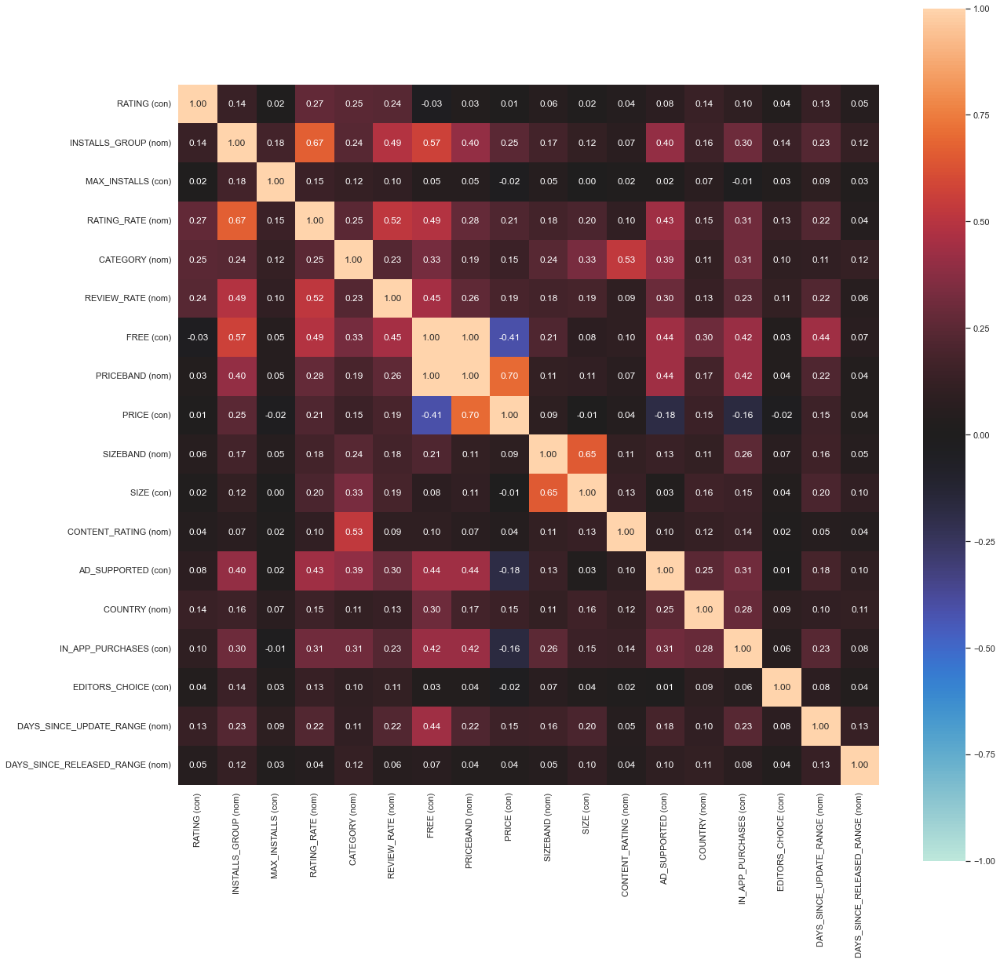

In [16]:
jointDf = df_cleaned[['RATING', 'INSTALLS_GROUP', 'MAX_INSTALLS', 'RATING_RATE', 'CATEGORY', 'REVIEW_RATE', 'FREE', 'PRICEBAND', 'PRICE', 'SIZEBAND', 'SIZE', 'CONTENT_RATING', 'AD_SUPPORTED', 'COUNTRY', 'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE_RANGE', 'DAYS_SINCE_RELEASED_RANGE']]
nominal.associations(jointDf, figsize = (20, 20), mark_columns=True);

We change some numerical variable to categorical because we wanted to **improve the signal-to-noise ratio**. Fitting a model to bins reduces the impact that small fluctuates in the data has on the model. Each bin **minimize the noises** in sections of the data.<br>
For example: 
- INSTALLS_GROUP(categorical) has higher association value than MAX_INSTALLS(numerical)
- PRICEBAND(categorical) has higher association value than PRICE(numerical)
- SIZEBAND(categorical) has higher association value than SIZE(numerical)

---

This heat map shows the correlation between all the variables. Since our problem statement focuses on rating and installs, we focus only on row 1 and 2.

For row 1 (rating), most of the the correlation of the different variables is quite close to 0, with 0.27 being the highest, which is category. 

Next, we move on to installs group which is row 2. We can see that the overall correlations are higher.

Since there is not much of a strong relationship for rating, it might be too challenging to predict the rating of an app since the accuracy would not be high. In this case, we will **only do EDA on INSTALLS_GROUP**.

---

**How do we calculate the correlation between categorical variables and numerical variables?**<br>
Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map.
It will then calculate the correlation/strength-of-association of features in data-set with both categorical and continuous features.

---



### Export the files
#### This is to avoid changes to our latest dataset that might affect our model building.

In [17]:
file_path = "./datasets/google_app_scrap_cleaned2.csv"
df_cleaned.to_csv(path_or_buf=file_path, index=False);

<a id = 'installs EDA'></a>
## `INSTALLS_GROUP` EDA
Please play around with the tree map below to understand the demographic of our dataset. Click into each section to choose the combination of the feature of your app.

In [18]:
temp = df_cleaned.copy()

temp['FREE_STR'] = temp['FREE']*1
temp['AD_SUPPORTED_STR'] = temp['AD_SUPPORTED']*1
temp['IN_APP_PURCHASES_STR'] = temp['IN_APP_PURCHASES']*1
temp['EDITORS_CHOICE_STR'] = temp['EDITORS_CHOICE']*1
temp[['FREE_STR', 'AD_SUPPORTED_STR', 'IN_APP_PURCHASES_STR', 'EDITORS_CHOICE_STR']] = temp[['FREE_STR', 'AD_SUPPORTED_STR', 'IN_APP_PURCHASES_STR', 'EDITORS_CHOICE_STR']].astype(str)

# Change the feature's boolean value to strings. So that the user can navigate themselves better in the treemap
temp.loc[temp.FREE_STR == '1', 'FREE_STR'] = "Free"
temp.loc[temp.FREE_STR == '0', 'FREE_STR'] = "Paid"
temp.loc[temp.AD_SUPPORTED_STR == '1', 'AD_SUPPORTED_STR'] = "Ad-supported"
temp.loc[temp.AD_SUPPORTED_STR == '0', 'AD_SUPPORTED_STR'] = "Not ad-supported"
temp.loc[temp.IN_APP_PURCHASES_STR == '1', 'IN_APP_PURCHASES_STR'] = "Has in app purchases"
temp.loc[temp.IN_APP_PURCHASES_STR == '0', 'IN_APP_PURCHASES_STR'] = "Don't have in app purchases"
temp.loc[temp.EDITORS_CHOICE_STR == '1', 'EDITORS_CHOICE_STR'] = "Editor's choice"
temp.loc[temp.EDITORS_CHOICE_STR == '0', 'EDITORS_CHOICE_STR'] = "Not editor's choice"

fig = px.treemap(temp, path=[px.Constant("all"), 'EDITORS_CHOICE_STR', 'FREE_STR', 'IN_APP_PURCHASES_STR', 'AD_SUPPORTED_STR', 'CATEGORY', 'CONTENT_RATING'],
                 values='MAX_INSTALLS', title = 'Installation count for each type of feature combinations') 
# fig.update_traces(root_color="lightgrey")
fig.data[0].textinfo = 'label + value'
fig.layout.hovermode = False
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()


### What is Google Play Store's installation count's distribution?

                      INSTALLS_GROUP
Between 100K and 10M            9044
Less than 100K                  5023
More than 10M                   3408


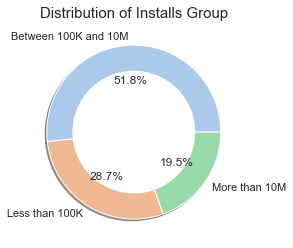

In [19]:
print(df_cleaned['INSTALLS_GROUP'] .value_counts().to_frame())

label = df_cleaned['INSTALLS_GROUP'].value_counts().index.tolist()
pie_fig = plt.pie(x = df_cleaned['INSTALLS_GROUP'].value_counts().to_frame().INSTALLS_GROUP, labels = label, 
                  autopct='%1.1f%%', shadow = True, colors = ['#abc9ea', '#efb792', '#98daa7'])
my_circle=plt.Circle((0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Distribution of Installs Group", size = 15)
plt.show()

Almost half the number of apps have installs between 100,000 and 10,000,000.

### `INSTALLS_GROUP` VS `RATING`

Average rating of an app: 4.158705050741056


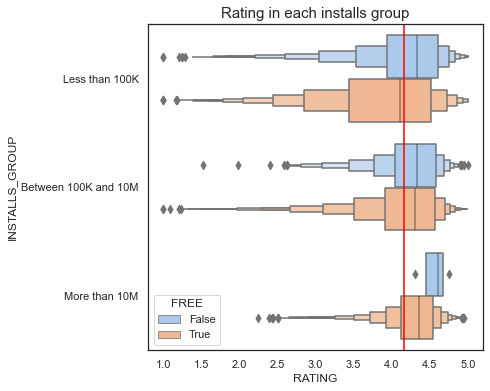

In [20]:
print("Average rating of an app: " + str(df_cleaned['RATING'].mean()))
fig, x = plt.subplots(figsize = (6, 6))
sb.boxenplot(y = 'INSTALLS_GROUP', x = 'RATING', hue = 'FREE', data = df_cleaned, palette = 'pastel')
plt.title("Rating in each installs group", size = 15)
plt.axvline(df_cleaned.RATING.mean(), linewidth = 1.5, color = 'red')
plt.show()

Paid apps with more than 10M of installs are most likely to be rated higher and it's less spread out in the y-axis. <br> This is showed clearly by the bottom blue boxenplot. In short, the first 2 sections out from the centerline contain 50% of the data. After that, the next 2 sections contain 25% of the data. Each level is shaded lighter. So, if there's no multiple bands spread out, but rather all are concentrated within a band, it means it has fewer outliers.<br>
Free apps with less than 100K of installs have most of the sample size spread out wider. 
<br>The red line is the mean rating for all apps.

### `INSTALLS_GROUP` VS `EDITORS_CHOICE`

Percentage of apps that are awarded Editors's Choice in each install group:
Between 100K and 10M : 1.02 %
Less than 100K : 0.10 %
More than 10M : 4.93 %


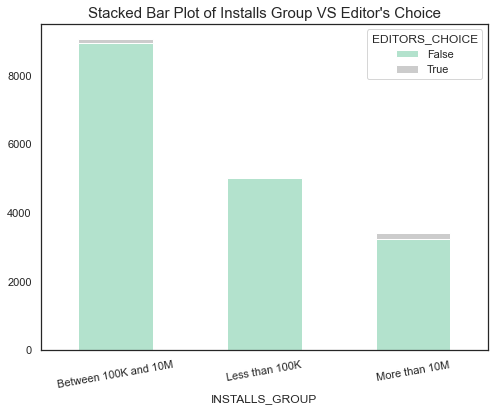

In [21]:
plt.rcParams["figure.figsize"] = (8,6)
order = df_cleaned['INSTALLS_GROUP'].value_counts().index.tolist()
print('Percentage of apps that are awarded Editors\'s Choice in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['EDITORS_CHOICE'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['EDITORS_CHOICE'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['EDITORS_CHOICE'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['EDITORS_CHOICE'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='Pastel2')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS Editor\'s Choice", size = 15)
plt.show()

Most of the app are not awarded with 'Editor's Choice'. But there's a slight increase in the likeliness of an app being an 'Editor's Choice' app if they have more installs.

### `INSTALLS_GROUP` VS `FREE`

Percentage of apps that are free in each install group:
Between 100K and 10M : 91.76 %
Less than 100K : 44.08 %
More than 10M : 99.91 %


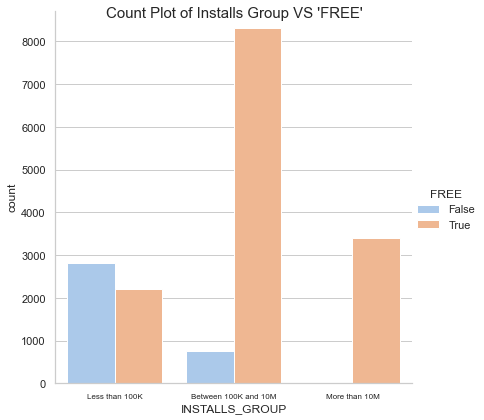

In [22]:
order = df_cleaned['INSTALLS_GROUP'].value_counts().index.tolist()
print('Percentage of apps that are free in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == False)]))),"%")
sb.set_theme(style = "whitegrid", palette="pastel")
plot = sb.catplot(x="INSTALLS_GROUP", hue="FREE", kind="count", data=df_cleaned, height= 6)
plot.fig.suptitle("Count Plot of Installs Group VS 'FREE'", fontsize = 15)
plot.set_xticklabels(fontsize=8)
plt.show()

Apps that has more than 100K of installs are more likely to be free. Apps that has less installs are less likely to be free because the majority of players don't play paid games. If an app is paid, it's more likely to have less than 100K of installs.

### `INSTALLS_GROUP` VS `AD_SUPPORTED`

Percentage of apps that have advertisement in each install group:
Between 100K and 10M : 55.23 %
Less than 100K : 20.53 %
More than 10M : 76.58 %


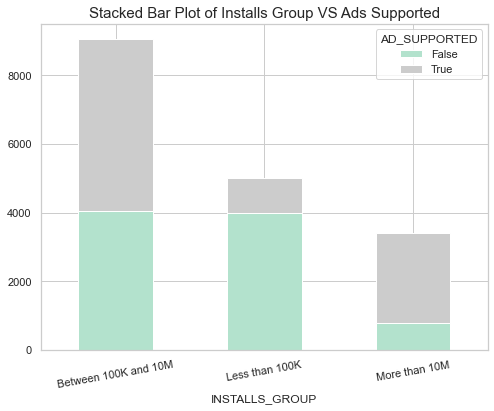

In [23]:
plt.rcParams["figure.figsize"] = (8,6)
order = df_cleaned['INSTALLS_GROUP'].value_counts().index.tolist()
print('Percentage of apps that have advertisement in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['AD_SUPPORTED'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='Pastel2')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS Ads Supported", size = 15)
plt.show()

Apps that has more than 100K of installs are more likely to be ad-supported as the developer company might need a source of income to maintain the company and game. 

### `INSTALLS_GROUP` VS `IN_APP_PURCHASES`

Percentage of apps that have in app purchases in each install group:
Between 100K and 10M : 63.11 %
Less than 100K : 36.37 %
More than 10M : 76.56 %


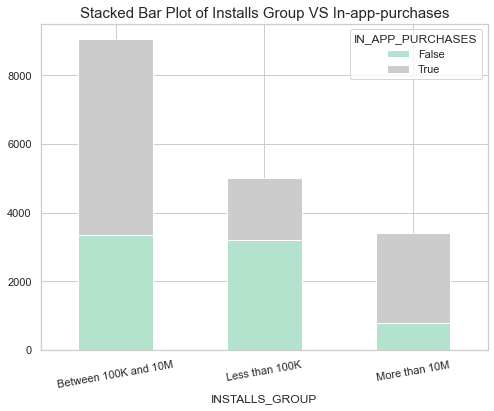

In [24]:
order = df_cleaned['INSTALLS_GROUP'].value_counts().index.tolist()
print('Percentage of apps that have in app purchases in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['IN_APP_PURCHASES'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='Pastel2')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS In-app-purchases", size = 15)
plt.show()

It's quite common to have in-app purchases for games that are popular. Apps with higher traction (more installs) will plan to make profit through in app purchases.

### `INSTALLS_GROUP` VS `CONTENT_RATING`

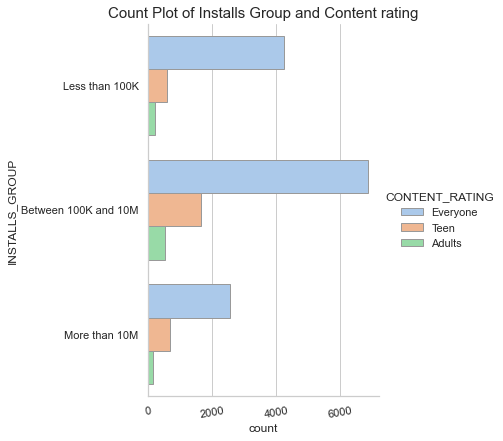

In [25]:
sb.catplot(y="INSTALLS_GROUP", hue="CONTENT_RATING", kind="count",
            palette="pastel", edgecolor=".6",
            data=df_cleaned, height= 6)
plt.xticks(rotation = 10)
plt.title("Count Plot of Installs Group and Content rating", size = 15)
plt.show()

Most of the app in this dataset are for everyone. And 'Adults' apps are significantly low in all install groups, especially for apps more than 10M of installs.

### `INSTALLS_GROUP` VS `DAYS_SINCE_UPDATE`

In [26]:
fig = px.histogram(df_cleaned, x="DAYS_SINCE_UPDATE_RANGE", title='Distribution of Days Since Last Update of Apps').update_xaxes(categoryorder = "total descending")
fig.update_layout(
    width=500,
    height=500
)
fig.show()

Most of the apps are updated more than 6 months ago or within 1 month. 
This are the polar opposites, which means good apps are more likely to be updated 1-3 months.
But poor apps are not that frequently updated.

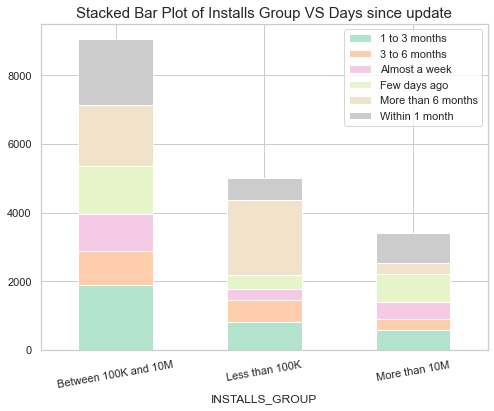

In [27]:
plt.rcParams["figure.figsize"] = (8,6)
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['DAYS_SINCE_UPDATE_RANGE'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='Pastel2')
plt.xticks(rotation = 10)
plt.legend(loc = 0)
plt.title("Stacked Bar Plot of Installs Group VS Days since update", size = 15)
plt.show()

Apps with less than 100K of installs typically are less updated. As the last update is like more than 6 months ago.<br>For apps with more than 100K installs, it's more frequently updated.<br>Especially for apps more than 10M of installs, they are updated few days ago, or at most within 1 month ago.

### `INSTALLS_GROUP` VS `REVIEW_COUNT`

In [28]:
temp = outliers(df_cleaned, "REVIEW_COUNT")

There is 2723 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8073.75
REVIEW_COUNT lower limit:  -4732.25


In [29]:
fig1 = go.Box(x = df_cleaned["REVIEW_COUNT"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["REVIEW_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Box Plot of Installs Group VS Review Count",
                                                        "Box Plot of Installs Group VS Review Count(Outliers Removed)"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=1000,
    height=800
)

There's a significant increase in installs as the apps get more review count. For apps with more than 10M installs have extreme amount of review count.<br> But the distribution is quite even compared to the other 2 groups because the majority of the apps with 10M installs are dispersed in 1000 to 4000 reviews. This is considered a wide gap compared to apps with less than 100K installs.


### `INSTALLS_GROUP` VS`RATING_RATE`

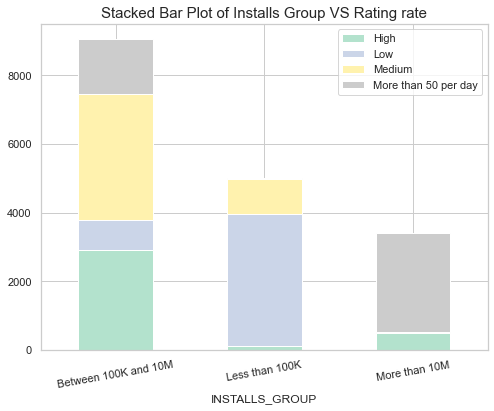

In [30]:
plt.rcParams["figure.figsize"] = (8,6)
newdf = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['RATING_RATE'])
newdf.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='Pastel2')
plt.xticks(rotation = 10)
plt.legend(loc = 0)
plt.title("Stacked Bar Plot of Installs Group VS Rating rate", size = 15)
plt.show()

Apps with less then 100K installs have low rating counts as well as low rating rates. 
As the installation count increases, the rating rate is increasing as well. (High rating rate means less than 50 and more than 10)

### `INSTALLS_GROUP` VS `SIZE`

In [31]:
temp2 = outliers(df_cleaned, "SIZE")

There is 692 outliers in "SIZE" field.
SIZE upper limit:  165000000.0
SIZE lower limit:  -67000000.0


In [32]:
fig1 = go.Box(x = df_cleaned["SIZE"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp2["SIZE"], y = temp2["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Box Plot of Installs Group VS Size",
                                                        "Box Plot of Installs Group VS Size(Outliers Removed)"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=1000,
    height=800
)

Before removing outliers, the figure squeezed on the left side (positively skewed). <br>
After removing outliers, we can observe the size distribution better.

### `MAX_INSTALLS` VS `SIZE`

There is 2694 outliers in "MAX_INSTALLS" field.
MAX_INSTALLS upper limit:  14807107.25
MAX_INSTALLS lower limit:  -8781102.75


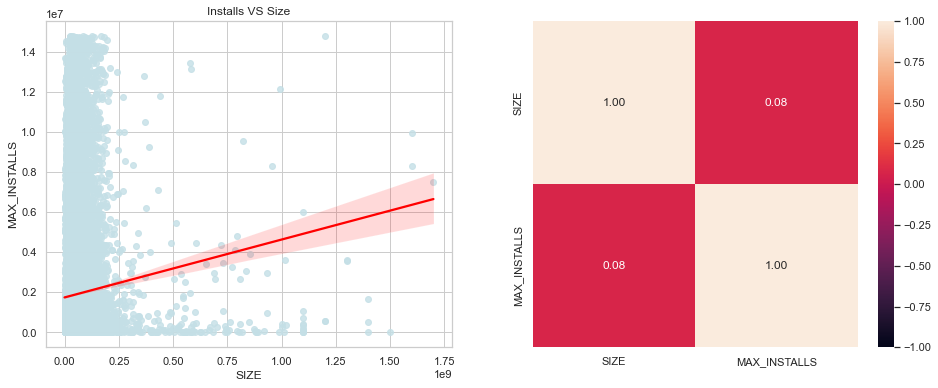

<Figure size 576x576 with 0 Axes>

In [33]:
f, (ax1, ax2) = plt.subplots(ncols = 2, sharey = False, figsize=(16, 6))

new = outliers(df_cleaned, 'MAX_INSTALLS')

plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="MAX_INSTALLS", data = new, color = '#c4dfe6', line_kws={"color":"red"}, ax = ax1).set(title = 'Installs VS Size')

joint = new[['SIZE', 'MAX_INSTALLS']]
sb.heatmap(joint.corr(), vmin = 1, vmax = -1, annot = True, fmt = ".2f", ax = ax2)
plt.show()

Let's use Dython to observe the association value between numerical and categorical install count and size. 

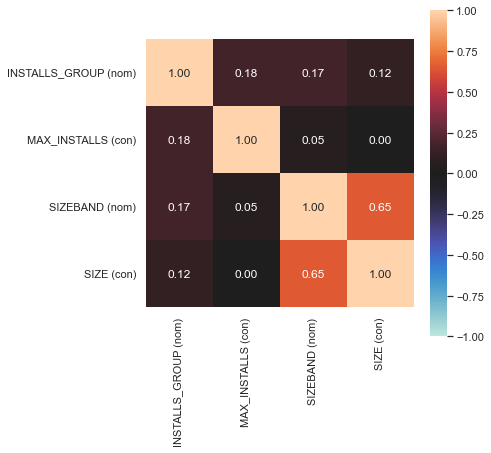

In [34]:
jointDf = df_cleaned[['INSTALLS_GROUP', 'MAX_INSTALLS', 'SIZEBAND', 'SIZE']]
nominal.associations(jointDf, figsize = (6, 6), mark_columns=True);

Apps with more than 100K of installs requires a greater amount of space (generally). But apps with less than 100K installs have alot of outliers in terms of their size. <br>
There's strong linear relationship between max installs and size, but the correlation between them is very low. But if we were to change our perspective to comparing installs group and size band, the association value looks more reasonable.

---

The values we get from Dython for categorical variables is higher. And this proves our previous point, using categorical rather than numerical can reduce the noise.

### `INSTALLS_GROUP` VS `CATEGORY`

In [35]:
df_cleaned["CATEGORY"].unique()

array(['Lifestyle', 'Puzzle', 'Racing', 'Role Playing', 'Dating',
       'Beauty', 'Books & Reference', 'Video Players & Editors', 'Tools',
       'Communication', 'Simulation', 'Trivia', 'Entertainment',
       'Libraries & Demo', 'Personalization', 'Finance', 'Education',
       'News & Magazines', 'Music & Audio', 'Card', 'Travel & Local',
       'Social', 'Medical', 'Strategy', 'Arcade', 'Photography', 'Board',
       'Productivity', 'Weather', 'Health & Fitness', 'Business',
       'Action', 'Comics', 'Events', 'Casual', 'Shopping', 'Parenting',
       'Maps & Navigation', 'Sports', 'House & Home', 'Art & Design',
       'Word', 'Casino', 'Food & Drink', 'Adventure', 'Music',
       'Auto & Vehicles', 'Educational'], dtype=object)

Before we start to analyse CATEGORY, there are 17 categories that are considered as games, this info is gotten from the app scraper, we will identify them first.

In [36]:
games_categories = ["Puzzle", "Racing", "Role Playing", "Simulation", "Trivia", "Card", "Strategy", 
                    "Arcade", "Action", "Word", "Casino", "Adventure", "Educational", "Sports", "Board", 
                    "Casual", "Music"]
for i in range(len(df_cleaned)):
    if (df_cleaned.loc[i, "CATEGORY"] in games_categories):
        df_cleaned.loc[i, "CATEGORY"] = "Game"

### What are the most populated app in Google PlayStore? Show the distribution of categories.

In [37]:
install_sum = df_cleaned.groupby('CATEGORY')['MAX_INSTALLS'].count().to_frame()
install_sum.sort_values(by = 'MAX_INSTALLS', ascending = False, inplace = True)
install_sum = install_sum.head(30)
install_sum.reset_index(inplace = True)

category = install_sum['CATEGORY']
installs = install_sum['MAX_INSTALLS']
fig = go.Figure(go.Treemap(
    labels = category,
    parents = [""]*len(category),
    values = installs,
    textinfo = "label+percent entry"))
fig.show()

Game is highly saturated in this dataset. We will make some conversions later  during model building.

### Installation count for each `CATEGORY`

In [38]:
fig = px.box(df_cleaned, x = "INSTALLS", color = "CATEGORY")
fig.update_layout(
    width=1400,
    height=1000,
    paper_bgcolor="LightSteelBlue",
    title="INSTALLS ACROSS CATEGORY"
)
fig.show()

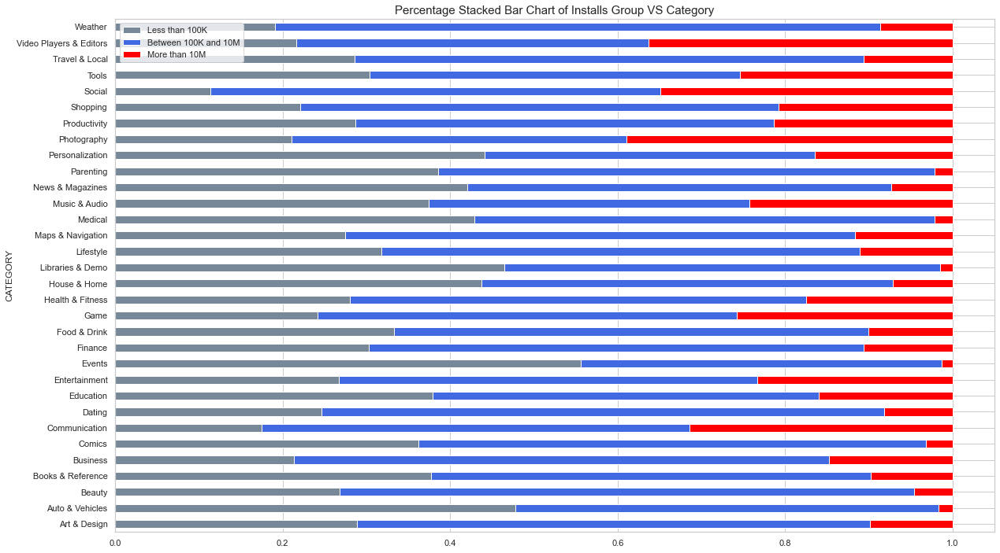

In [39]:
a = pd.crosstab(index = df_cleaned.CATEGORY, columns = df_cleaned.INSTALLS_GROUP)
a['Total'] = a.sum(axis = 1)
a['Between 100K and 10M'] = a['Between 100K and 10M']/a['Total'].round(2)
a['Less than 100K'] = a['Less than 100K']/a['Total'].round(2)
a['More than 10M'] = a['More than 10M']/a['Total'].round(2)
a.drop(['Total'], axis=1, inplace = True)
a = a[['Less than 100K', 'Between 100K and 10M', 'More than 10M']]

a.plot(kind = 'barh', stacked = True, figsize = (20, 12), color = ['lightslategrey', 'royalblue', 'red'])
plt.title("Percentage Stacked Bar Chart of Installs Group VS Category", size = 15)
plt.legend(loc = 'upper left')
plt.show()

This percentage stacked bar chart is overwhelming. Let's break it down.

In [40]:
def num_plots(df, col, title, xlabel):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,6),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=15)
    sb.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=col, data=df, ax=ax[1])
    ax[1].set_xlabel(xlabel, fontsize=12)
    plt.tight_layout()
    plt.show()

There is 2694 outliers in "MAX_INSTALLS" field.
MAX_INSTALLS upper limit:  14807107.25
MAX_INSTALLS lower limit:  -8781102.75


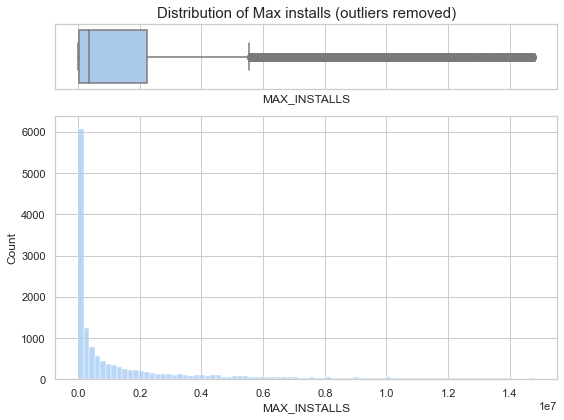

In [41]:
outliers(df_cleaned, 'MAX_INSTALLS')
temp = df_cleaned[df_cleaned['MAX_INSTALLS'] < 14807107.25]
num_plots(df_cleaned.loc[df_cleaned['MAX_INSTALLS'] < 14807107.25], 'MAX_INSTALLS', "Distribution of Max installs (outliers removed)", 'MAX_INSTALLS')

The distribution of max installs is highly skewed positively. 

In [42]:
install_median = df_cleaned.groupby('CATEGORY')['MAX_INSTALLS'].median().to_frame()
install_median.sort_values(by = 'MAX_INSTALLS', ascending = False, inplace = True)
install_median = install_median.head(30)
install_median.reset_index(inplace = True)
install_median

,CATEGORY,MAX_INSTALLS
0,Photography,4320338.0
1,Social,3965248.0
2,Video Players & Editors,3079519.0
3,Communication,2201105.5
4,Shopping,1773733.0
5,Game,1443494.0
6,Entertainment,1237366.5
7,Weather,976095.0
8,Productivity,952967.0
9,Tools,948649.0


### Demographic of top median installs per category

In [43]:
category = install_median['CATEGORY']
installs = install_median['MAX_INSTALLS']
fig = go.Figure(go.Treemap(
    labels = category,
    parents = [""]*len(category),
    values = installs,
    textinfo = "label+value"))
fig.show()

We decided to use median to plot out our treemap. <br>This is because the extreme values on the tail end of the distribution tend to pull the mean away from the center and towards the long tail. <br>
The median also does a better job of capturing the central location of a distribution when there are extreme outliers present in the data.

Text(0.5, 1.0, 'Top 5 categories with highest median installs in paid apps')

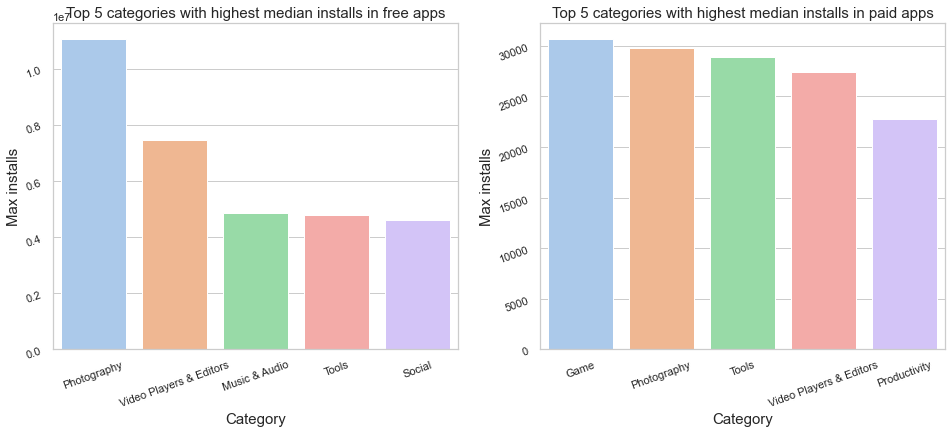

In [44]:
TOP5FREE = df_cleaned[df_cleaned['FREE'] == True].groupby('CATEGORY')['MAX_INSTALLS'].median().to_frame()
TOP5FREE.sort_values(by = 'MAX_INSTALLS', ascending = False, inplace = True)
TOP5FREE = TOP5FREE.head()
TOP5FREE.reset_index(inplace = True)

TOP5PAID = df_cleaned[df_cleaned['FREE'] == False].groupby('CATEGORY')['MAX_INSTALLS'].median().to_frame()
TOP5PAID.sort_values(by = 'MAX_INSTALLS', ascending = False, inplace = True)
TOP5PAID = TOP5PAID.head()
TOP5PAID.reset_index(inplace = True)

f, (ax1, ax2) = plt.subplots(ncols = 2, sharey = False, figsize=(16, 6))
sb.barplot(data = TOP5FREE, x = 'CATEGORY', y = 'MAX_INSTALLS', ax = ax1, )
sb.barplot(data = TOP5PAID, x = 'CATEGORY', y = 'MAX_INSTALLS', ax = ax2)
ax1.set_xlabel("Category", fontsize = 15)
ax1.set_ylabel("Max installs", fontsize = 15)
ax1.tick_params(labelrotation=20)
ax1.set_title("Top 5 categories with highest median installs in free apps", fontsize = 15)
ax2.set_xlabel("Category", fontsize = 15)
ax2.set_ylabel("Max installs", fontsize = 15)
ax2.tick_params(labelrotation=20)
ax2.set_title("Top 5 categories with highest median installs in paid apps", fontsize = 15)

### Key takeaways from `INSTALLS_GROUP` EDA:
1. More than half of the apps have 100K-100M installs. 
2. The average rating of an app is 4.16
3. Apps with more than 10M installs have a higher chance to be chosen as Editor's Choice.
4. 99.1% of apps with more than 10M installs are free.
5. 76.58% of apps with more than 10M installs are ad-supported.
6. 76.56% of apps with more than 10M installs has in-app purchases.
7. Apps with more than 10M installs are less likely to be rated as an 'Adults' app.
8. Apps with more than 10M installs are frequently updated, at most within a month. 
9. Apps with more than 10M installs has extreme review counts (more than 50 a day). 
10. Size has a strong linear relationship with install count.
11. Most of the apps are games.
12. The best free category based on median install is photography.
13. The best free category based on median install is game.




<a id='miscelleneous EDA'></a>
# Miscellaneous EDA
---
This part is about exploring the dataset even further through interesting perspectives  but it won't relate to the machine learning later.

<a id ='geospatial analysis'></a>
## Geospatial Analysis
We will use the same dataset but will drop those rows without values in the COUNTRY column.

In [45]:
df_country = df_cleaned.dropna(subset=['COUNTRY'])
df_country.reset_index(drop= True, inplace=True)
df_country.shape

(11588, 33)

### 1. Comparing the average of max installs of the apps developed by each country.

In [46]:
max_installs_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["MAX_INSTALLS"].agg("mean"))
max_installs_by_mean.rename(columns={'MAX_INSTALLS': 'MEAN_MAX_INSTALLS'}, inplace = True)
max_installs_by_mean = max_installs_by_mean.nlargest(30,['MEAN_MAX_INSTALLS'])
max_installs_by_mean = max_installs_by_mean.reset_index()
sequence = []
for i in range (3000,0,-100):
    sequence.append(i)
max_installs_by_mean['SIZE'] = sequence
max_installs_by_mean
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS,SIZE
0,Luxembourg,4.879105e+08,3000
1,Oman,6.050167e+07,2900
2,Finland,6.021174e+07,2800
3,South Korea,5.321177e+07,2700
4,Singapore,5.044285e+07,2600
5,Usa,4.926557e+07,2500
6,Denmark,4.643689e+07,2400
7,Norway,3.377678e+07,2300
8,Ireland,2.922904e+07,2200
9,Cyprus,2.620449e+07,2100


In [47]:
fig = px.bar(max_installs_by_mean, x='COUNTRY', y='MEAN_MAX_INSTALLS')
fig.update_layout(
    width=800,
    height=500,
    title='MEAN_MAX_INSTALLS VS COUNTRY'
)
fig.show()

In [48]:
fig = px.scatter_geo(max_installs_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", size = 'MEAN_MAX_INSTALLS',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

It's suprising to us that USA (ranked 6th) and Japan (ranked 27th) which are known to be great countries to develop games fall behind Luxembourg, in Europe. Suprisingly, European country apps perform really well in terms of mean max installs. 

### 2. Comparing the average rating of the apps developed by each country.
We will do the same thing, but this time we will explore on the rating.

In [49]:
rating_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["RATING"].agg("mean"))
rating_by_mean.rename(columns={'RATING': 'MEAN_RATING'}, inplace = True)

In [50]:
fig = px.box(rating_by_mean, x = "MEAN_RATING",points="all")
fig.update_layout(
    width=600,
    height=300,
    title='MEAN_RATING DISTRIBUTION'
)
fig.show()

This figure gives us 2 types of visualizations, boxplot and swarmplot. Which provide us an insight where the majority of data lies in the rating spectrum. Which is 4 to 4.5. <br>
Notice there's a few outliers that have rating that are lower than 3.5. Let's find out which countries are those.

In [51]:
lowest_mean_rating = rating_by_mean[rating_by_mean['MEAN_RATING'] < 3.5]
lowest_mean_rating

,MEAN_RATING
COUNTRY,
Belize,3.288830
Iceland,3.462838
Uganda,2.200000


In [52]:
rating_by_mean = rating_by_mean.nlargest(30,['MEAN_RATING'])
rating_by_mean = rating_by_mean.reset_index()
sequence = []
for i in range (3000,0,-100):
    sequence.append(i)
rating_by_mean['SIZE'] = sequence
rating_by_mean


,COUNTRY,MEAN_RATING,SIZE
0,Montenegro,4.800969,3000
1,Venezuela,4.670000,2900
2,Albania,4.633178,2800
3,Costa Rica,4.566433,2700
4,Andorra,4.549720,2600
5,Nepal,4.540000,2500
6,Uruguay,4.539158,2400
7,Peru,4.535119,2300
8,Tanzania,4.527273,2200
9,Ghana,4.511662,2100


In [53]:
fig = px.bar(rating_by_mean, x='COUNTRY', y='MEAN_RATING')
fig.update_layout(
    width=800,
    height=500,
    title='MEAN_RATING VS COUNTRY'
)
fig.show()

In [54]:
fig = px.scatter_geo(rating_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", hover_data=["MEAN_RATING"], size = 'SIZE',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

If we look at average rating, we can see more western countries appear on the map. <br>
Compared to the previous map, this map's bubbles are more consistent and we can clearly see which bubble is bigger. Because we introduced a rank metric called SIZE which will change the bubble size according the ranking of the country instead of the mean ratings. 

### Key takeaways from Geospatial analysis:
1. Luxembourg is ranked 1st in mean max installs in the world.
2. Montenegro is ranked 1st in mean rating in the world. 
3. Singapore is ranked 5th in mean max installs in the world, but ranked 26th in mean rating.

---

<a id='singapore EDA'></a>
## Singapore EDA

In [55]:
df_cleaned = df.copy()
country_df = pd.read_csv("./datasets/developer_country.csv")

# Remove # from each row in DEVELOPER_ADDRESS column to match the format of 
# mapping in the country_df
for i in range(df_cleaned.shape[0]):
    developer_addr = df_cleaned.loc[i, "DEVELOPER_ADDRESS"]
    if (pd.isnull(developer_addr)):
        continue
    df_cleaned.loc[i, "DEVELOPER_ADDRESS"] = developer_addr.replace("#", " ")

# Map to country
df_cleaned['COUNTRY']=df_cleaned[['DEVELOPER_ADDRESS']].merge(country_df,how='left').COUNTRY
    
# Reposition the COUNTRY column
df_cleaned.insert(17, 'COUNTRY', df_cleaned.pop('COUNTRY'))


In [56]:
sg = df_cleaned.loc[df_cleaned['COUNTRY'] == 'Singapore']
sg

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
36,1942 🚀 Free classic shooting games,4.587898,Arcade,73531,3418,1592,3184,5478,59859,5305.0,"5,000,000+",8991266,True,0.0,47000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone,True,True,False,488.0,1461.0
37,1945 Air Force: Airplane games,4.698587,Arcade,1952163,48977,19288,61575,211427,1610896,34945.0,"100,000,000+",112131352,True,0.0,190000000.0,ONESOFT,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,10.0,1099.0
72,2nd phone number - call & sms,3.250000,Communication,13226,5031,648,0,1048,6499,264.0,"1,000,000+",4492802,True,0.0,24000000.0,High-quality Internet call,"10 Eunos Road 8, 01-123",Singapore,Everyone,True,True,False,112.0,949.0
118,456 Survival Challenge,4.197674,Action,70831,8599,2741,4022,6131,49338,655.0,"10,000,000+",18331140,True,0.0,57000000.0,Azura Global,"Pulau Tekong, Singapore",Singapore,Teen,True,False,False,99.0,144.0
123,4Fun Lite - Live Chat Room,4.100000,Social,40144,7953,0,757,2272,29162,74.0,"10,000,000+",14874675,True,0.0,79000000.0,SpreadFun,3 FRASER STREET， 05-25，DUO TOWER，SINGAPORE,Singapore,Mature 17+,True,True,False,15.0,592.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16694,X Icon Changer - Change Icons,4.205725,Personalization,367342,44198,11220,19599,42058,250267,8468.0,"10,000,000+",20955146,True,0.0,14000000.0,ASTER PLAY,80 SOUTH BRIDGE ROAD 04-02\r\nGOLDEN CASTLE B...,Singapore,Everyone,True,True,False,111.0,937.0
16849,Yugto,4.630769,Books & Reference,53165,1227,395,3057,7363,41123,430.0,"1,000,000+",4100184,True,0.0,26000000.0,Dreame Media,"11 WOODLANDS CLOSE 08-20, SINGAPORE",Singapore,Teen,False,True,False,84.0,461.0
16931,Zombie War Idle Defense Game,4.448276,Casual,38747,3435,1145,1336,1527,31304,591.0,"5,000,000+",7033818,True,0.0,131000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,4.0,467.0
17131,"iQIYI-Drama, Anime, Show",4.456103,Entertainment,829479,82545,15040,18621,38139,675134,2913.0,"50,000,000+",52838429,True,0.0,47000000.0,iQIYI,"6 SHENTON WAY, 33-00, OUE DOWNTOWN, SINGAPORE",Singapore,Everyone,True,True,False,7.0,1020.0


In [57]:
print("Number of games in Singapore:",len(sg))
print("Number of developers in Singapore:",len(sg["DEVELOPER"].unique()))

Number of games in Singapore: 287
Number of developers in Singapore: 152


It seems like there are developers that created more than one app. Let's find out which developer has the most number of apps developed.

In [58]:
temp = sg.groupby(['DEVELOPER']).size().reset_index(name='COUNT').sort_values(by = 'COUNT', ascending = False)
temp

,DEVELOPER,COUNT
3,AMANOTES PTE LTD,17
94,OneSoft Global PTE. LTD.,14
73,LIHUHU PTE. LTD.,11
102,PlaySimple Games,11
35,Dreame Media,8
...,...,...
58,Hinovel,1
57,High-quality Internet call,1
56,Healint,1
51,HAGO,1


Let's choose the top 10 apps by rating and installs in Singapore.<br>
First, we sort the singapore dataset by installation count, then rating.<br>
After that, we take the top 10.

In [59]:
sg_top_10_rated = sg.sort_values(["MAX_INSTALLS", "RATING"], ascending = False)
sg_top_10_rated = sg_top_10_rated.head(10)
sg_top_10_rated

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
14788,TikTok,4.531077,Social,46313808,3333817,752861,1439620,3244446,37543064,1819908.0,"1,000,000,000+",2023376909,True,0.0,98000000.0,TikTok Pte. Ltd.,"201 Henderson Road,\r\n 06-22 Apex@Henderson,\...",Singapore,Teen,True,True,False,5.0,2434.0
12467,SHAREit: Share & File Manager,4.156039,Tools,16968065,2637001,496300,690263,902531,12241970,50315.0,"1,000,000,000+",1810333419,True,0.0,51000000.0,Smart Media4U Technology Pte.Ltd.,2 VENTURE DRIVE 11-30 VISION EXCHANGE SINGAPO...,Singapore,Everyone,True,False,False,1.0,3236.0
5859,Garena Free Fire - Illuminate,3.921184,Action,106026036,23983506,2183863,3267671,5361237,71229759,529596.0,"1,000,000,000+",1183906520,True,0.0,47000000.0,Garena International I,"1 FUSIONOPOLIS PLACE, 17-10, GALAXIS, Singapore",Singapore,Mature 17+,False,True,False,27.0,1552.0
8558,MX Player,4.461469,Video Players & Editors,11483886,837623,229919,489742,1164603,8761999,164844.0,"1,000,000,000+",1068034575,True,0.0,47000000.0,MX Media (formerly J2 Interactive),"71 Robinson Road,\r\n 14-01, Singapore - 068895",Singapore,Everyone,True,False,False,6.0,3886.0
10585,PUBG MOBILE: Aftermath,4.100963,Action,41487245,7662453,839604,1185157,1759589,30040442,795148.0,"500,000,000+",600285723,True,0.0,47000000.0,Level Infinite,10 ANSON ROAD 21-07 INTERNATIONAL PLAZA SING...,Singapore,Teen,True,True,True,55.0,1450.0
8610,Magic Tiles 3,3.935281,Music,2832992,447567,142573,222086,354141,1666625,95367.0,"100,000,000+",484629075,True,0.0,47000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Everyone,True,True,False,11.0,1838.0
14803,Tiles Hop: EDM Rush!,4.168087,Music,3011736,372687,115026,176130,317346,2030547,77783.0,"100,000,000+",448568681,True,0.0,108000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Teen,True,True,False,17.0,1512.0
1497,BeautyPlus-Snap Retouch Filter,4.486657,Photography,4814223,354636,91863,164567,447883,3755274,30405.0,"100,000,000+",430106338,True,0.0,219000000.0,PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,"80 Robinson Road 02-00, Singapore 068898",Singapore,Everyone,True,True,False,4.0,3159.0
15953,"WPS Office-PDF,Word,Excel,PPT",4.315896,Productivity,3742522,355120,95942,204036,443825,2643599,56023.0,"100,000,000+",428810135,True,0.0,126000000.0,WPS SOFTWARE PTE. LTD.,6 RAFFLES QUAY 14-06 SINGAPORE,Singapore,Everyone,True,True,False,11.0,3883.0
16115,WeChat,3.748641,Communication,6103916,1400688,216129,380447,626143,3480509,212964.0,"100,000,000+",366352173,True,0.0,396000000.0,WeChat International Pte. Ltd.,"10 Anson Rd, 21-07, International Plaza, Sing...",Singapore,Everyone,False,True,False,11.0,4055.0


The top 3 most installs app developed in Singapore is TikTok, followed by SHAREit, and Garena Free Fire.<br>

TikTok is well known in the world. It is not surprising that it is on the list of best apps, but it is very surprising that the developer company is located in Singapore, instead of in China which is where the app originated. <br>

SHAREit on the other hand, is a service that allows you to share the cost of a subscription with your friends and family or to find co-subscribers. This allows user to have cheaper access to famous platforms such as Spotify, Netflix, YouTube Premium and Microsoft 365. This explains why this app has such a high installation count as it has some connections with other famous apps around the world. <br>

Garena Free Fire is a mobile game app that is developed in 2017. According to Sensor Tower Store Intelligence, Garena Free Fire is the top grossing mobile battle royale shooters in the US in first quarter of 2021, overtaking PUBG Mobile, which is in the fifth place of this list.<br>

Another interesting part is the 9th and 10th app on this list. The 9th one is WPS Office, a well known substitute for microsoft office. While the 10th one is WeChat, another app that originated in China but has its developer company located in Singapore.

### Singapore Top performing developers
We will determine the reputation of a developer by evaluating their sum of all of their application's max installation count and average rating of each application.

In [60]:
data2 = sg[["APP_NAME", "DEVELOPER", "RATING", "MAX_INSTALLS"]]
avg_rating = data2.groupby(["DEVELOPER"])["RATING"].mean().to_frame()
sum_installs = data2.groupby(["DEVELOPER"])["MAX_INSTALLS"].sum().to_frame()
sg_dev = pd.merge(avg_rating, sum_installs, on = "DEVELOPER")
sg_dev.sort_values(["RATING", "MAX_INSTALLS"], ascending = False).head(10)

,RATING,MAX_INSTALLS
DEVELOPER,,
EKATOX APPS,4.932414,100223415
Strong Fitness PTE. LTD.,4.889066,1625464
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
"Fonts, QR Code Scanner, Reader & Generator",4.843281,4417815
PLAYNEXX GAMES,4.842593,500701
SM Health Team,4.841572,5633058
Guru Puzzle Game,4.841342,38255880
BOUNCE ENTERTAINMENT COMPANY LIMITED,4.830189,204942
DB RR STUDIO,4.825671,5796815


### Singapore EDA
1. Number of games in Singapore: 287
2. Number of developers in Singapore: 152
3. TikTok is the top 1 app in Singapore based on max installs and rating.
4. EKATOX APPS	is the top 1 Singapore developer in terms of its apps' rating ans max installs.

<a id='fang EDA'></a>
## FANG EDA

In [61]:
facebook_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Meta Platforms, Inc."]
amazon_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Amazon Mobile LLC"]
netflix_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Netflix, Inc."]
google_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Google LLC"]

FANG = [facebook_apps, amazon_apps, netflix_apps, google_apps]
stringFANG = ["Facebook", "Amazon", "Netflix", "Google"]

### How many apps did each company developed?


In [62]:
print("Facebook has developed", len(facebook_apps), "app(s).")
print("Amazon has developed", len(amazon_apps), "app(s).")
print("Netflix has developed", len(netflix_apps), "app(s).")
print("Google has developed", len(google_apps), "app(s).")

Facebook has developed 10 app(s).
Amazon has developed 17 app(s).
Netflix has developed 4 app(s).
Google has developed 65 app(s).


### How's the app rating for the company?

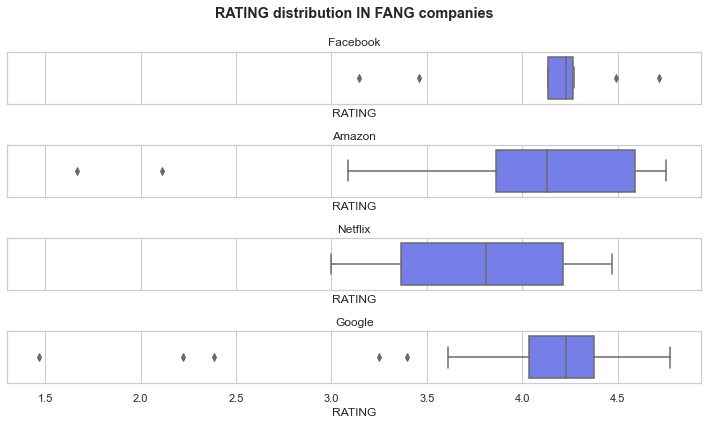

In [63]:
fig, axes = plt.subplots(4, 1, figsize = (10, 6), sharex = True)
x = 0
for i in FANG:
    sb.boxplot(data = i, x = "RATING", ax = axes[x], color = '#636efa')
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset

fig.suptitle('RATING distribution IN FANG companies',fontweight ="bold")
plt.tight_layout()


Facebook's apps have the most concentrated distribution of ratings while Netflix's apps have the lowest median. <br>

### What kind of apps do such great company develop?

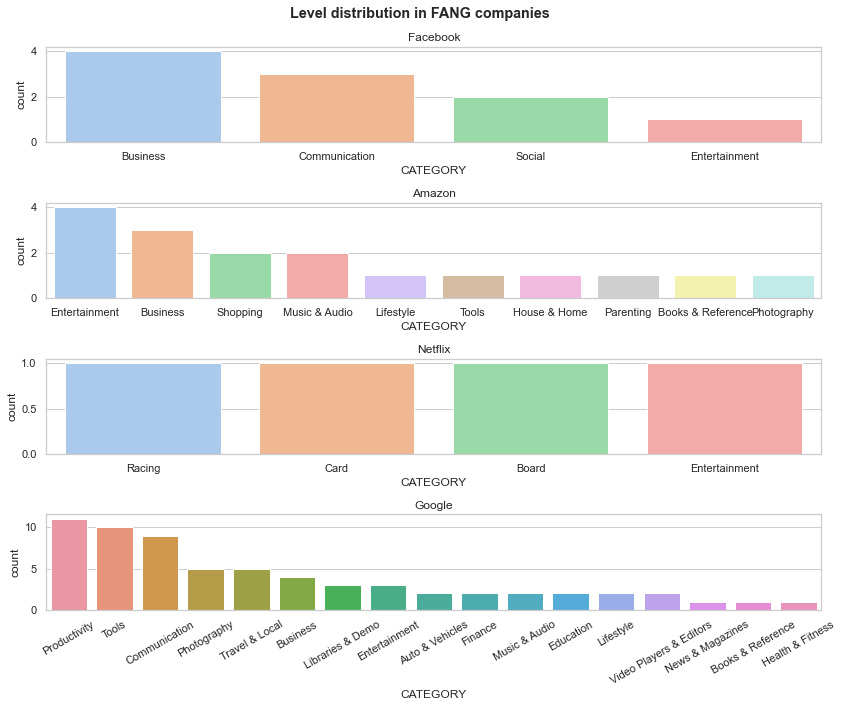

In [64]:
fig, axes = plt.subplots(4, 1, figsize = (12, 10))
x = 0
for i in FANG:
    sb.countplot(x = "CATEGORY", data = i, ax = axes[x] , order = i["CATEGORY"].value_counts().index)
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
fig.suptitle('Level distribution in FANG companies',fontweight ="bold")
plt.tight_layout()


The first three plots here is a little unintuitive and not expected. <br>
Facebook is well known for social media apps, but it shows that the mode category is business.<br>
Amazon is well known for its shopping platform, but here the mode category is entertainment. <br>
On the other hand, Netflix is well known for movies and series entertainment, but game is the most developed app here.<br>
Maybe we should try plotting this from a different perspective.

### Let's find out how each category did in each company, shall we?

Text(0.5, 1.04, 'Max Installs VS Category of Apps Developed by FANG')

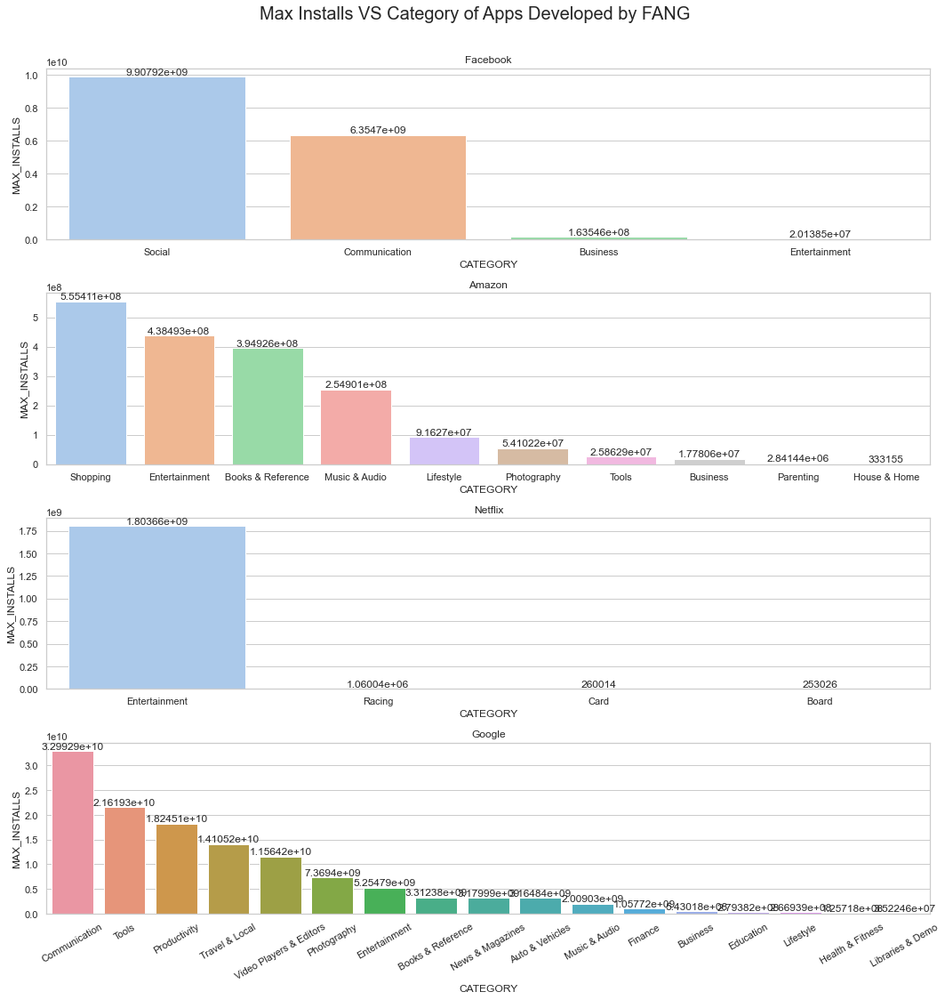

In [65]:
fb2 = facebook_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
amz2 = amazon_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
net2 = netflix_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
goog2 = google_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
FANG2 = [fb2, amz2, net2, goog2]

fig, axes = plt.subplots(4, 1, figsize = (15, 15))
x = 0
for i in FANG2:
    ax = sb.barplot(x = "CATEGORY", y = 'MAX_INSTALLS', data = i, ax = axes[x] , order = i.sort_values('MAX_INSTALLS', ascending = False).CATEGORY)
    ax.bar_label(ax.containers[0])
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()
plt.suptitle("Max Installs VS Category of Apps Developed by FANG", y = 1.04, size = 20)

These plots are much more intuitive now. <br>
In fact, Facebook's most well-known app falls under the 'Social' category because Facebook is a social media platform. <br>
And Amazon is a e-shopping platform while Netflix is an entertainment platform.<br>Google is the leading platform in tools, productivity and communication.

### Key takeaways from FANG EDA:
1. Out of the 4 titan companies, Google has developed the most number of apps - 65. 
2. Facebook develops social, communciation, and business apps.
3. Amazon develops shopping apps.
4. Netflix develops entertainment apps.
5. Facebook's apps have the most concentrated distribution of ratings while Netflix's apps have the lowest median.
6. Google develops productivity, tools, communication, business, travel & local apps.
7. Google's communication apps possess the highest amount of install compared to other 3 companies' categories.

### References
- http://shakedzy.xyz/dython/